## 🐶 Multi Class Dog Breed Classification
Building an end-end dog breed classifier using Pytorch and Pytorch Lightning Module

## 1.Problem
Identifying the Breed of the dog given the image of the dog.

## 2.Data
Data from Kaggle's Dog Breed Identification Competition
https://www.kaggle.com/c/dog-breed-identification/data

## 3.Evaluation
Prediction probabilities for each dog breed of each image.
[www.kaggle.com/competitions/dog-breed-identification/overview/evaluation](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

## 4.Features
* 120 breeds of dogs (120 classes)
* 10k+ images in both training and test set.

In [ ]:

import torch
import numpy as np
import pandas as pd
from PIL import Image
import os
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from torchvision import transforms,datasets
from torch.utils.data import DataLoader,Dataset
from torch import nn
import torch.nn.functional as F

### Data Processing

Extracting labels and preprocessing of input images (Converting to tensors and data augumentations if necessary)

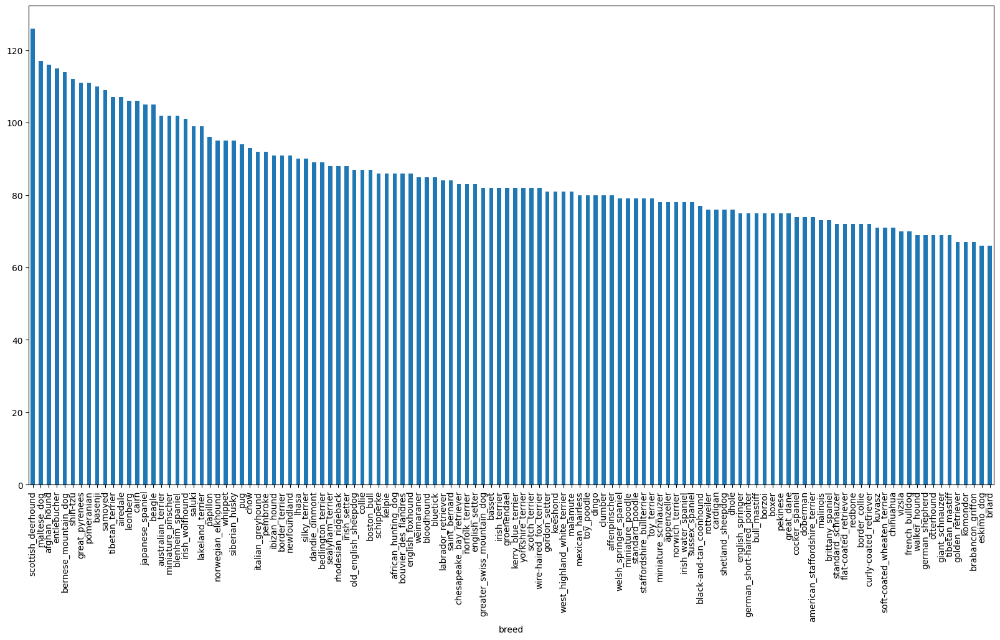

In [ ]:
labels_csv=pd.read_csv('')    #path to labels.csv
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));
labels=labels_csv['breed']

Structure the data and check for missing Values

In [ ]:
filenames=[' '+fname+'.jpg' for fname in labels_csv['id']]  #Replace ' ' it with train/ path

#Checking for missing data for structured data
if len(os.listdir(' '))==len(filenames):                    #Replace ' ' it with train/ path
  print("Filenames match actual amount of files,Proceed!")
else:
  print("Filenames doesn't match the actual amount of files.Check the target directory.")
if len(labels)==len(filenames):
  print("Proceed!")
else:
  print("Check the Target Directory!!")

Filenames match actual amount of files,Proceed!
Proceed!


Preparing Labels

In [5]:
#Checking the number of unique labels
unique_labels=np.unique(labels)

#One Hot encoding of our labels
# onehot_labels=[(label==unique_labels).astype(int) for label in labels]
# print(len(onehot_labels))

#Mapping the index for labels
breed2idx = {breed: idx for idx, breed in enumerate(unique_labels)}

#Mapping it back if needed
idx2breed = {idx: breed for breed, idx in breed2idx.items()}

#Convert labels to index
labels_idx = labels.map(breed2idx).values


Creating a Custom Dataset in Pytorch which is compatible for both train and test data

In [6]:
#Creating a custom Dataset.

class DogDataset(Dataset):
  """
  Custom Dataset for train and test datas
  INPUTS:
    image_paths
    labels:None (except for training data) [Labels as index values]
    transform:None
  OUTPUT:
      Returns transformed image (also labels if training data)
  """

  def __init__(self,image_paths,labels=None,transform=None):
    super().__init__()
    self.image_paths=image_paths
    self.labels=labels
    self.transform=transform

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, idx):
    img_path=self.image_paths[idx]
    image=Image.open(img_path).convert("RGB")
    if self.transform:
        image = self.transform(image)
    if self.labels is not None:
       label=torch.tensor(self.labels[idx],dtype=torch.long)
       return image,label
    else:
       return image



In [7]:
IMG_SIZE=224
BATCH_SIZE=32


def get_transforms(is_train=True, img_size=IMG_SIZE, random_flip=False, random_rotation=False):

  """
  Returns the appropriate transforms for train and test data.
  Inputs:
    is_train-Bool (True for training data)
    img_size - Int (224)
    random_flip - Bool (True for training data)
    random_rotation - Bool (True for training data)
  Output:
    Transforms
  """
  transform_list = [transforms.Resize((img_size, img_size))]

  if is_train:
      if random_flip:
          transform_list.append(transforms.RandomHorizontalFlip(p=0.3))
      if random_rotation:
          transform_list.append(transforms.RandomRotation(degrees=15))

  transform_list += [
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406],
                  std=[0.229, 0.224, 0.225])
  ]

  return transforms.Compose(transform_list)


#Getting the appropriate transforms and setting the number of images to use for training
train_transform=get_transforms(is_train=True, random_flip=True, random_rotation=True)
test_transform=get_transforms(is_train=False)
NUM_IMAGES = len(filenames)
dataset=DogDataset(filenames[:NUM_IMAGES],labels_idx[:NUM_IMAGES],train_transform)

#Create Train-Val split and corresponding Dataloaders
train_size = int(0.8*len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
train_loader=DataLoader(train_dataset,batch_size=BATCH_SIZE,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(len(dataset),train_size,val_size)

10222 8177 2045


Visualizing data (Images and Labels)

In [ ]:
def unnormalize(img, mean, std):
    """
    Undo normalization for visualization.
    img: (C,H,W) tensor
    """
    img = img.clone()  # avoid modifying in-place
    for c, (m, s) in enumerate(zip(mean, std)):
        img[c] = img[c] * s + m
    return img

def show_first_n(images,labels,n=5):
  """
  Displays a plot of n images and its labels from a data batch
  n=5 by default
  """
  plt.figure(figsize=(10,10))
  for i in range(n):
    #ax=plt.subplot(5,5,i+1)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    img = unnormalize(images[i], mean, std)
    if img.shape[0]==3:
      img=img.permute(1,2,0)
    plt.imshow(img)
    plt.title(unique_labels[labels[i].item()])
    plt.axis('off')
    plt.tight_layout()
train_images , train_labels = next(iter(train_loader))
val_images , val_labels = next(iter(val_loader))

First 5 Training Images and labels (Shuffled)
First 5 Validation images and labels


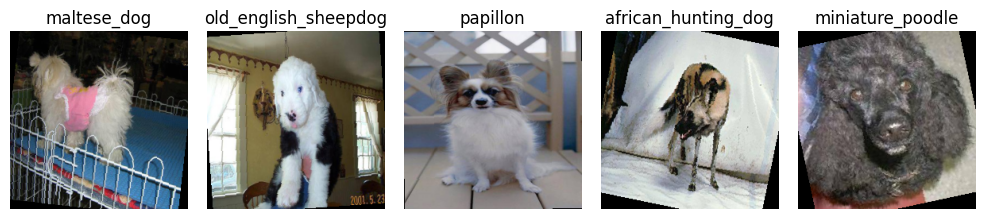

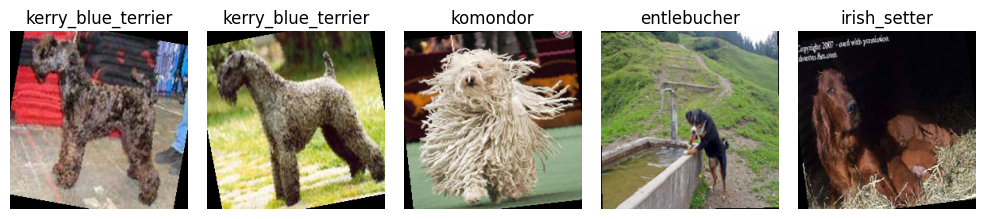

In [9]:
print("First 5 Training Images and labels (Shuffled)")
show_first_n(train_images,train_labels)
print("First 5 Validation images and labels")
show_first_n(val_images,val_labels)

### BUILDING MODEL USING TRANSFER LEARNING

Using Transfer learning for Classification

Models available to use:

    1.Efficientnet_b0 (INPUT_SHAPE = 224)

    2.Resnet50 (INPUT_SHAPE=224)

    3.MobileNet_V3_Large (INPUT_SHAPE =224)

In [10]:
#Import Model
from torchvision.models import (efficientnet_b0,EfficientNet_B0_Weights,resnet50,ResNet50_Weights,
                                mobilenet_v3_large,MobileNet_V3_Large_Weights)


def build_backbone(name:str,num_classes:int):
  """
  Build the corresponding backbone network using pretrained weights
  INPUTS:
    name :['efficientnet_b0','resnet50','mobilenet_v3_large']
    num_classes: 120
  """

  if name=='efficientnet_b0':
    model=efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
    in_features = model.classifier[1].in_features
    model.classifier[1]=nn.Linear(in_features=in_features,out_features=num_classes)
    return model
  elif name=='resnet50':
    model=resnet50(weights=ResNet50_Weights.DEFAULT)
    in_features = model.fc.in_features
    model.fc=nn.Linear(in_features=in_features,out_features=num_classes)
    return model
  elif name=='mobilenet_v3_large':
    model=mobilenet_v3_large(weights=MobileNet_V3_Large_Weights.DEFAULT)
    in_features = model.classifier[3].in_features
    model.classifier[3]=nn.Linear(in_features=in_features,out_features=num_classes)
    return model
  else:
    raise ValueError(f"Backbone Model {name} not supported!")


Using Pytorch Lightning for better scalability

In [ ]:
#Importing the modules
import pytorch_lightning as pl
import torch.nn as nn
from torchmetrics import Accuracy
from pytorch_lightning.callbacks import ModelCheckpoint,EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from datetime import datetime

#Setting up Logger(Tensorboard), and callbacks(Early Stopping and Module Checkpoint)
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
log_dir = " "               #Path to logs

logger = TensorBoardLogger(
    save_dir=log_dir,   # your existing log folder
    name=f"run_{timestamp}"  # subfolder for this run
)

#Stops the training if Validation accuracy drops 
early_stop_callback = EarlyStopping(
    monitor="val_acc_epoch",
    patience=5,     # number of epochs with no improvement
    mode="max"
)

#Saves the top-k (k=1) best model's checkpoint at the specified directory by monitoring the validation accuracy metric
model_checkpoint_callback = ModelCheckpoint(
    dirpath=" ",             #Path to save the checkpoint
    filename="best-checkpoint--{val_acc_epoch:.4f}",
    monitor="val_acc_epoch",
    save_top_k=1,
    mode="max",
    save_last=False
)

Dog Breed Classifier Class wrapped with Pytorch Lightning

In [12]:
class DogBreedClassifier(pl.LightningModule):
  """
  Model wraps the pretrained backbone and finetunes it for multi-class classification.
  Includes a backbone architecture, loss function(CrossEntropyLoss), optimizer(AdamW),
  metric(Accuracy) which gets logged in Tensorboard Logger
  INPUTS:
    num_classes : 120
    backbone : ['efficientnet_b0','resnet50','mobilenet_v3_large']
    learning rate : 1e-3 by default
  """

  def __init__(self,num_classes,backbone='efficientnet_b7',lr=1e-3):
    super().__init__()
    self.save_hyperparameters()
    self.model = build_backbone(backbone,num_classes)
    self.criterion = nn.CrossEntropyLoss()
    self.train_acc = Accuracy(task='multiclass',num_classes=num_classes)
    self.val_acc = Accuracy(task='multiclass',num_classes=num_classes)

  def forward(self,x):
    return self.model(x)

  def training_step(self,batch,batch_idx):
    x,y = batch
    logits = self(x)
    loss= self.criterion(logits,y)
    preds=torch.argmax(logits,dim=1)
    self.train_acc.update(preds,y)
    self.log('train_loss',loss,prog_bar=True,on_epoch=True)
    self.log('train_acc',self.train_acc,prog_bar=True,on_epoch=True)
    return loss

  def validation_step(self, batch, batch_idx):
    x, y = batch
    logits = self(x)
    loss = self.criterion(logits, y)
    preds = torch.argmax(logits, dim=1)
    self.val_acc.update(preds, y)
    self.log('val_loss', loss, prog_bar=True,on_epoch=True)
    self.log('val_acc', self.val_acc, prog_bar=True,on_epoch =True)
    # if batch_idx == 0:
    #         self.visualize_predictions(x, y, logits)

  def predict_step(self, batch, batch_idx, dataloader_idx=0):
    x = batch if isinstance(batch, torch.Tensor) else batch[0]  # support both (x,y) or x-only datasets
    logits = self(x)
    probs = torch.softmax(logits, dim=1)
    return probs

  def on_train_epoch_end(self):
    self.log("train_acc_epoch",self.train_acc.compute(),prog_bar=True,on_epoch=True)
    self.train_acc.reset()

  def on_validation_epoch_end(self):
    self.log("val_acc_epoch",self.val_acc.compute(),prog_bar=True,on_epoch =True)
    self.val_acc.reset()

  def configure_optimizers(self):
    optimizer = torch.optim.AdamW(self.parameters(), lr=self.hparams.lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)
    return {"optimizer":optimizer,"lr_scheduler": {
        "scheduler": scheduler,
        "interval": "epoch",
        "monitor": "val_loss"
    }}


### TRAINING AND EVALUATING THE MODEL
Initializing and training the model

In [ ]:
model = DogBreedClassifier(num_classes=len(unique_labels),backbone='efficientnet_b0',lr=1e-3)

trainer = pl.Trainer(max_epochs=25,accelerator='auto',devices=1,logger=logger,callbacks=[early_stop_callback,model_checkpoint_callback])
trainer.fit(model,train_loader,val_loader)

In [ ]:
#Not needed if using Module Checkpoint Callback
def save_model(model,save_dir):
  """
  Saves the model State_dict for reusing at specified directory
  Inputs:
    model: model_name(DogBreedClassifier),
    dir : Directory to save the model

  """
  os.makedirs(save_dir, exist_ok=True)

  # Create datetime string
  timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

  # Filename
  filename = f"{timestamp}_{model.__class__.__name__}.pth"
  filepath = os.path.join(save_dir, filename)

  # Save only model weights
  torch.save(model.state_dict(), filepath)
  print(f"✅ Model saved at: {filepath}")


In [ ]:
model_dir =" "  # Directory for the Model to be saved
save_model(model,model_dir)

### VISUALIZATIONS
See the logging metrics using tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir  /logs   #Path to logs

In [15]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

def plot_images_with_topk(model, dataloader, unique_labels, n=5, topk=10,
                          mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]):
    """
    Plots n images with their top-k predictions
    INPUTS:
      model         : DogBreedClassifier
      dataloader    : DataLoader (train,val,test)
      unique_labels : list of class names
      n             : number of images to show
      topk          : number of top predictions in bar chart
    """
    model.eval()
    device = model.device

    # Get one batch
    images, labels = next(iter(dataloader))
    images, labels = images.to(device), labels.to(device)

    # Forward pass
    with torch.no_grad():
        logits = model(images)
        probs = F.softmax(logits, dim=1)

    # Limit to n images
    n = min(n, images.size(0))

    fig, axes = plt.subplots(n, 2, figsize=(10, 4*n))

    if n == 1:
        axes = [axes]  # make iterable

    for i in range(n):
        img = images[i].cpu().clone()
        img = img * torch.tensor(std).view(3,1,1) + torch.tensor(mean).view(3,1,1)
        img = img.clamp(0,1)
        if img.shape[0] == 3:
            img = img.permute(1,2,0)

        true_label = unique_labels[labels[i].item()]

        # === Left side: Image ===
        axes[i][0].imshow(img)
        axes[i][0].axis("off")

        # Title: green if correct, red if wrong
        pred = torch.argmax(probs[i]).item()
        pred_label = unique_labels[pred]
        if pred == labels[i].item():
            axes[i][0].set_title(f"✔ {pred_label}", color="green")
        else:
            axes[i][0].set_title(f"✘ Pred: {pred_label}\nTrue: {true_label}", color="red")

        # === Right side: Top-k bar chart ===
        top_probs, top_idx = probs[i].topk(topk)
        top_labels = [unique_labels[idx.item()] for idx in top_idx]

        colors = ["green" if idx.item() == labels[i].item() else "blue" for idx in top_idx]

        axes[i][1].barh(range(topk-1,-1,-1), top_probs.cpu(), color=colors)
        axes[i][1].set_yticks(range(topk-1,-1,-1))
        axes[i][1].set_yticklabels(top_labels)
        axes[i][1].set_xlabel("Probability")
        axes[i][1].set_title("Top Predictions")

    plt.tight_layout()
    plt.show()


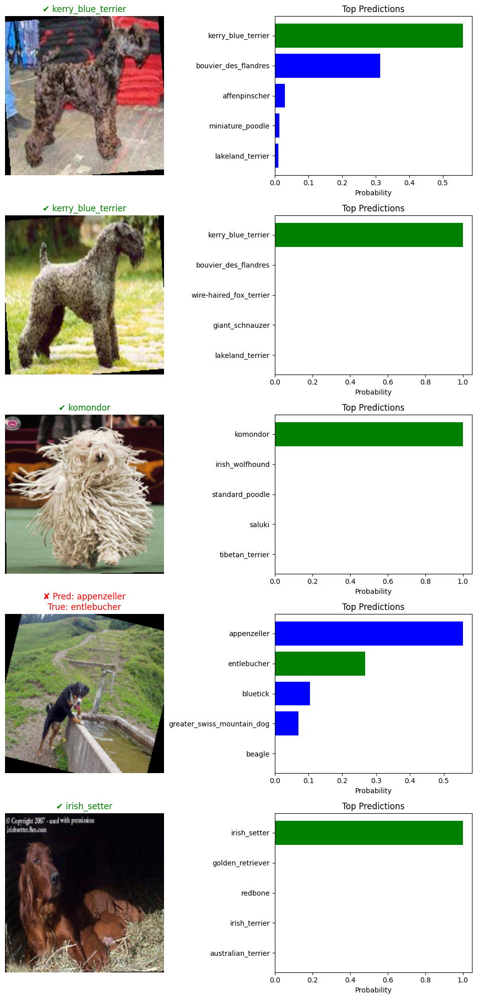

In [16]:
plot_images_with_topk(model, val_loader, unique_labels, n=5, topk=5)


### TESTING THE MODEL


In [ ]:
import os

def test_data_loading(data_dir):
  """
  Create dataloader and and extracting their ids(for submission usage)
  INPUT:
    data_dir: Directory in which test data are in.
  """
  test_filenames=[os.path.join(data_dir,fname) for fname in os.listdir(data_dir)]
  test_ids = [os.path.splitext(os.path.basename(p))[0] for p in test_filenames]
  test_transform=get_transforms(is_train=False)
  test_dataset=DogDataset(test_filenames,None,test_transform)
  test_loader=DataLoader(test_dataset,batch_size=BATCH_SIZE,shuffle=False)
  return test_loader,test_ids

test_dir=" "  #Path to /test
test_loader,test_ids=test_data_loading(test_dir)

In [ ]:
model = DogBreedClassifier.load_from_checkpoint(' ')   #Path to saved checkpoint
trainer = pl.Trainer(accelerator='auto',devices=1)
probs_list=trainer.predict(model,test_loader)


### OUTPUTS TO SUBMIT IN KAGGLE



In [ ]:
probs = torch.cat(probs_list, dim=0)
print(probs.shape)
submission_data = pd.DataFrame(probs.cpu().numpy(),columns=unique_labels)
submission_data.insert(0,'id',test_ids)
print(submission_data.shape)


torch.Size([10357, 120])
(10357, 121)


In [ ]:
submission_data.to_csv(' ',index=False)   #Path to save the csv file for Submission